In [3]:
import aiapy
import astropy
import astropy.time
import astropy.units as u
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import sunpy
import sunpy.map
# from aiapy.calibrate import (
#     correct_degradation,
#     degradation,
#     estimate_error,
#     fetch_spikes,
#     normalize_exposure,
#     register,
#     respike,
#     update_pointing,
# )
from aiapy.calibrate.util import get_correction_table
from aiapy.psf import deconvolve, psf
from aiapy.response import Channel
from astropy.coordinates import SkyCoord
from astropy.visualization import ImageNormalize, LogStretch, time_support
from sunpy.net import Fido
from sunpy.net import attrs as a
from sunpy.time import parse_time

# Increases the figure size in this notebook.
mpl.rcParams["savefig.dpi"] = 400
mpl.rcParams["figure.dpi"] = 400

In [2]:
!pip install aiapy

In [9]:
t_start = parse_time("2024-08-11T22:30:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 20 * u.s),
    a.Instrument('aia'),
    a.Wavelength(1600*u.Angstrom)
)


In [10]:
search_results[0]

Start Time,End Time,Source,Instrument,Wavelength,Provider,Physobs,Wavetype,Extent Width,Extent Length,Extent Type,Size
,,,,Angstrom,,,,,,,Mibyte
Time,Time,str3,str3,float64[2],str4,str9,str6,str4,str4,str8,float64
2024-08-11 22:30:14.000,2024-08-11 22:30:15.000,SDO,AIA,1600.0 .. 1600.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,64.64844


In [11]:
files1600 = Fido.fetch(search_results[0], max_conn=1)


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

In [12]:
m = sunpy.map.Map(files1600[0])

In [22]:
m.__dict__

{'_data': array([[-1.,  1., -2., ...,  2.,  0.,  1.],
        [-1., -2.,  0., ...,  2.,  0.,  0.],
        [ 0., -1.,  1., ...,  1.,  0.,  1.],
        ...,
        [ 0.,  0., -2., ...,  2.,  1.,  0.],
        [ 0.,  2.,  3., ...,  2.,  0., -1.],
        [ 0.,  0., -1., ...,  1.,  0.,  3.]], dtype=float32),
 '_mask': None,
 '_wcs': None,
 '_meta': MetaDict([('xtension': 'IMAGE')
 ('bitpix': '16')
 ('naxis': '2')
 ('naxis1': '4096')
 ('naxis2': '4096')
 ('pcount': '0')
 ('gcount': '1')
 ('simple': 'True')
 ('bld_vers': 'V9R5X')
 ('lvl_num': '1.0')
 ('t_rec': '2024-08-11T22:30:16Z')
 ('trecstep': '1.0')
 ('trecepoc': '1977.01.01_00:00:00_TAI')
 ('trecroun': '1')
 ('origin': 'SDO/JSOC-SDP')
 ('date': '2024-08-15T10:29:06')
 ('telescop': 'SDO/AIA')
 ('instrume': 'AIA_3')
 ('date-obs': '2024-08-11T22:30:14.13')
 ('t_obs': '2024-08-11T22:30:15.58Z')
 ('camera': '3')
 ('img_type': 'LIGHT')
 ('exptime': '2.901272')
 ('expsdev': '0.000129')
 ('int_time': '3.15625')
 ('wavelnth': '1600')
 ('wave

In [24]:
m.date

<Time object: scale='utc' format='isot' value=2024-08-11T22:30:14.130>

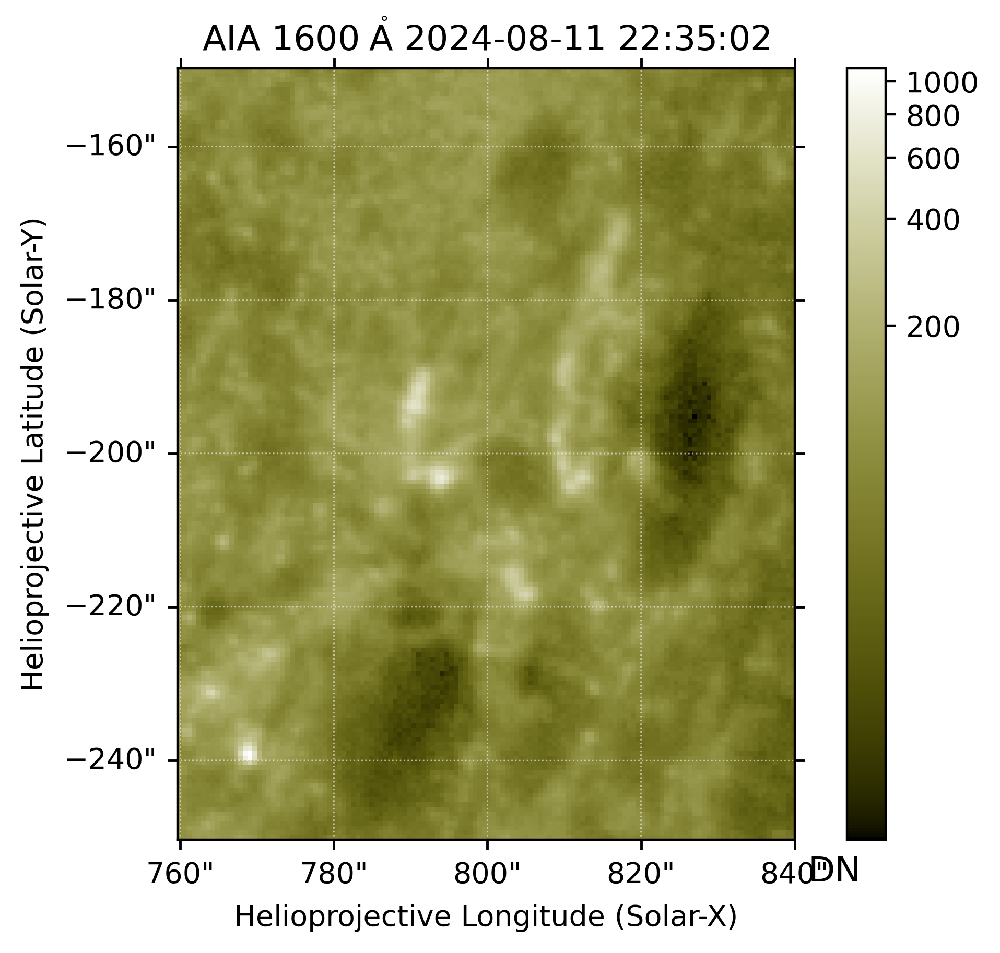

In [141]:
m = sunpy.map.Map(files1600[12])
blc = SkyCoord(760, -250, unit="arcsec", frame=m.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_c = m.submap(blc, **fov)

m_c.peek()

In [4]:
t_start = parse_time("2024-08-11T22:25:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 10 * u.min),
    a.Instrument('hmi')
)

In [8]:
search_results[0]

Start Time,End Time,Source,Instrument,Wavelength,Provider,Physobs,Wavetype,Extent Width,Extent Length,Extent Type,Size
,,,,Angstrom,,,,,,,Mibyte
Time,Time,str3,str3,float64[2],str4,str18,str6,str4,str4,str8,float64
2024-08-11 22:25:22.000,2024-08-11 22:25:23.000,SDO,HMI,6173.0 .. 6174.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,-0.00098
2024-08-11 22:25:22.000,2024-08-11 22:25:23.000,SDO,HMI,6173.0 .. 6174.0,JSOC,LOS_magnetic_field,NARROW,4096,4096,FULLDISK,-0.00098
2024-08-11 22:25:22.000,2024-08-11 22:25:23.000,SDO,HMI,6173.0 .. 6174.0,JSOC,LOS_velocity,NARROW,4096,4096,FULLDISK,-0.00098
2024-08-11 22:26:07.000,2024-08-11 22:26:08.000,SDO,HMI,6173.0 .. 6174.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,-0.00098
2024-08-11 22:26:07.000,2024-08-11 22:26:08.000,SDO,HMI,6173.0 .. 6174.0,JSOC,LOS_magnetic_field,NARROW,4096,4096,FULLDISK,-0.00098
2024-08-11 22:26:07.000,2024-08-11 22:26:08.000,SDO,HMI,6173.0 .. 6174.0,JSOC,LOS_velocity,NARROW,4096,4096,FULLDISK,-0.00098
2024-08-11 22:26:52.000,2024-08-11 22:26:53.000,SDO,HMI,6173.0 .. 6174.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,-0.00098
2024-08-11 22:26:52.000,2024-08-11 22:26:53.000,SDO,HMI,6173.0 .. 6174.0,JSOC,LOS_magnetic_field,NARROW,4096,4096,FULLDISK,-0.00098


In [9]:
files_hmi = Fido.fetch(search_results[0][1], max_conn=1)


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

hmi.m_45s.2024.08.11_22_26_15_TAI.magnetogram.fits:   0%|          | 0.00/16.3M [00:00<?, ?B/s]

In [21]:
hmiimg = astropy.io.fits.open(files_hmi[0])

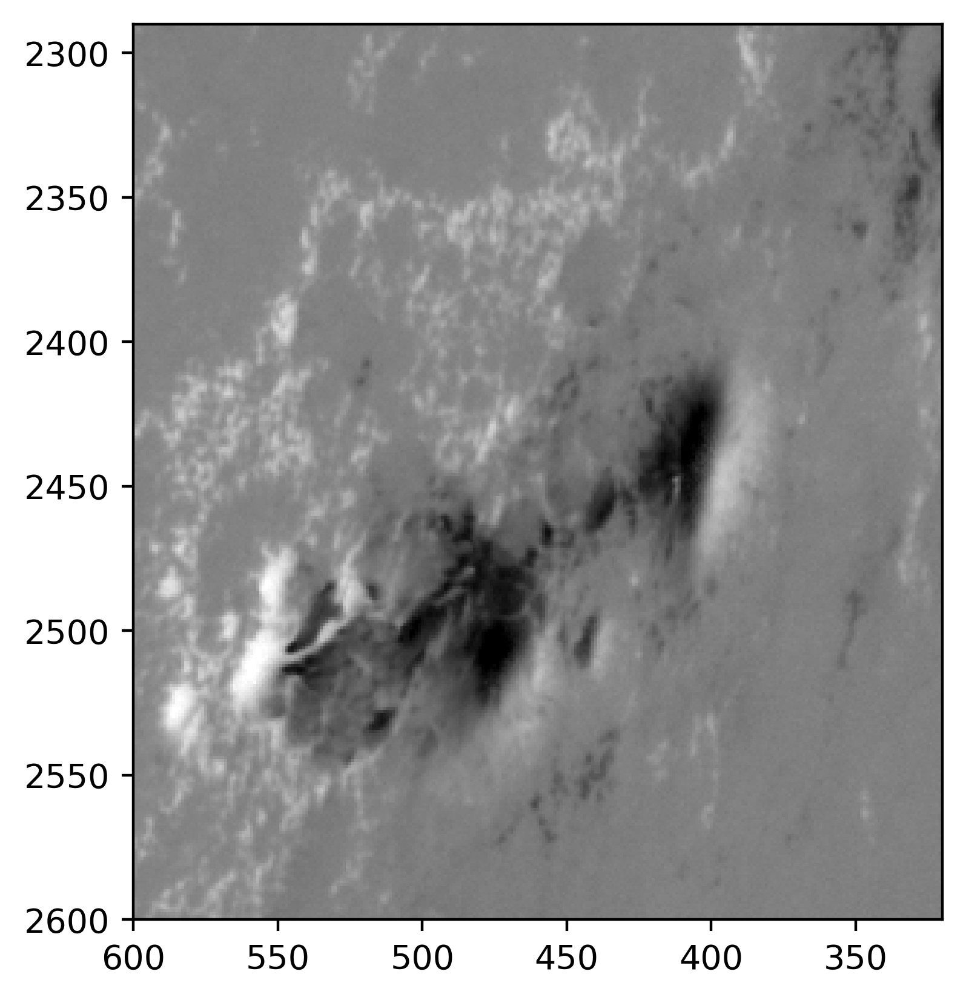

In [43]:
fig,ax=plt.subplots()
ax.imshow(hmiimg[1].data,cmap='grey',vmin=-1000,vmax=1000)
ax.set_ylim([2600,2290])
ax.set_xlim([320,600])
ax.invert_xaxis()

In [28]:
m=sunpy.map.sources.HMIMap(hmiimg[1].data,hmiimg[1].header)

VerifyError: Unparsable card (CRDER1), fix it first with .verify('fix').

ValueError: Cannot manually specify vmin, as the norm already has vmin set. To prevent this error set vmin on `m.plot_settings["norm"]` or the norm passed to `m.plot`.

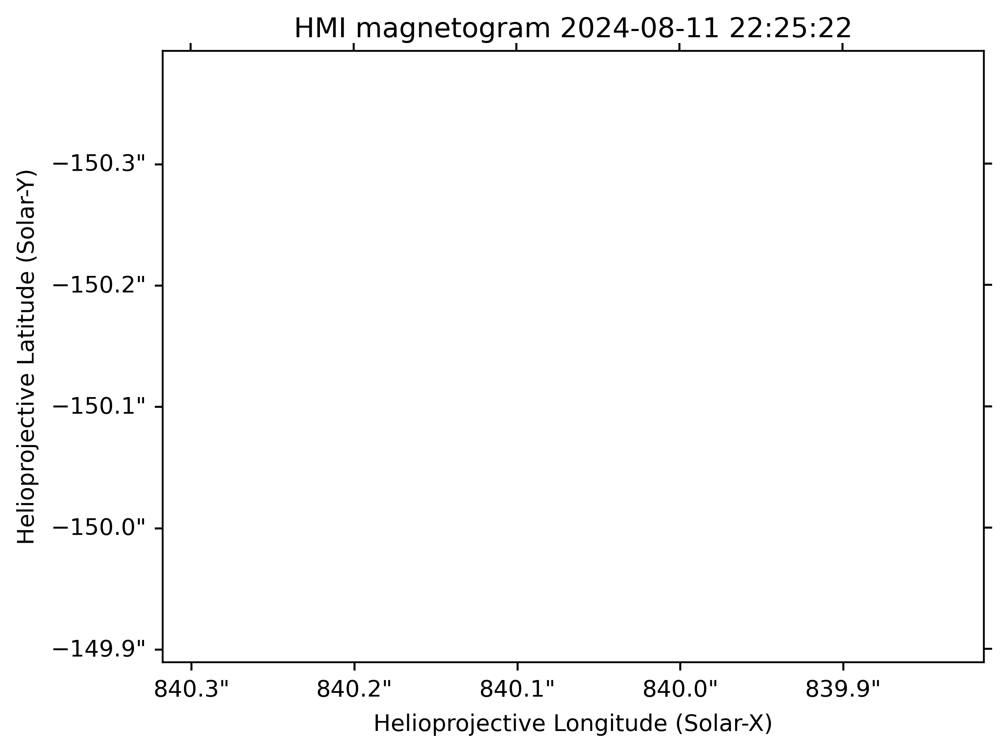

In [14]:
m = sunpy.map.Map(files_hmi)
blc = SkyCoord(760, -250, unit="arcsec", frame=m.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_c = m.submap(blc, **fov)

m_c.peek()

In [39]:
t_start = parse_time("2024-08-11T22:25:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 10 * u.min),
    a.Instrument('aia'),
    a.Wavelength(131*u.Angstrom)
)

In [40]:
files = Fido.fetch(search_results[0], max_conn=1)


Files Downloaded:   0%|          | 0/50 [00:00<?, ?file/s]

aia.lev1.131A_2024_08_11T22_25_06.64Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_25_18.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_25_30.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_25_42.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_25_54.65Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_26_06.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_26_18.62Z.image_lev1.fits:   0%|          | 0.00/8.74M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_26_30.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_26_42.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_26_54.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_27_06.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_27_18.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_27_30.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_27_42.63Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_27_54.64Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_28_06.63Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_28_18.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_28_30.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_28_42.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_28_54.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_29_06.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_29_18.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_29_30.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_29_42.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_30_06.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_30_18.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_30_30.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_30_42.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_30_54.63Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_31_06.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_31_18.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_31_30.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_31_42.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_31_54.62Z.image_lev1.fits:   0%|          | 0.00/8.74M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_32_06.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_32_18.62Z.image_lev1.fits:   0%|          | 0.00/8.73M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_32_30.62Z.image_lev1.fits:   0%|          | 0.00/8.74M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_32_42.63Z.image_lev1.fits:   0%|          | 0.00/8.74M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_32_54.62Z.image_lev1.fits:   0%|          | 0.00/8.74M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_33_06.63Z.image_lev1.fits:   0%|          | 0.00/8.74M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_33_18.62Z.image_lev1.fits:   0%|          | 0.00/8.74M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_33_30.62Z.image_lev1.fits:   0%|          | 0.00/8.74M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_33_42.62Z.image_lev1.fits:   0%|          | 0.00/8.74M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_33_54.62Z.image_lev1.fits:   0%|          | 0.00/8.74M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_34_06.62Z.image_lev1.fits:   0%|          | 0.00/8.74M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_34_18.62Z.image_lev1.fits:   0%|          | 0.00/8.74M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_34_30.62Z.image_lev1.fits:   0%|          | 0.00/8.74M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_34_42.62Z.image_lev1.fits:   0%|          | 0.00/8.74M [00:00<?, ?B/s]

aia.lev1.131A_2024_08_11T22_34_54.62Z.image_lev1.fits:   0%|          | 0.00/8.74M [00:00<?, ?B/s]

2025-10-02 09:22:50 - parfive - INFO: https://sdo7.nascom.nasa.gov/cgi-bin/drms_export.cgi?series=aia__lev1;compress=rice;record=131_1502490633-1502490633 failed to download with exception
Timeout on reading data from socket


1/0 files failed to download. Please check `.errors` for details


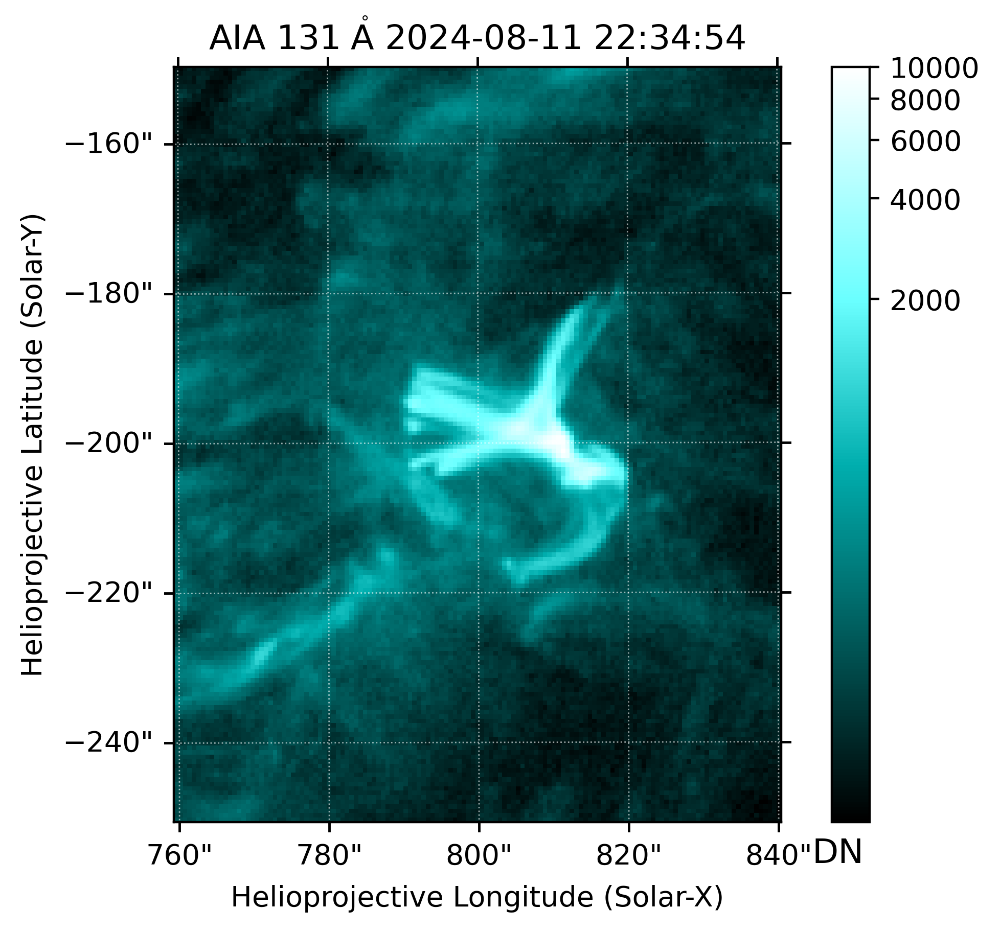

In [121]:
m = sunpy.map.Map(files[48])
blc = SkyCoord(760, -250, unit="arcsec", frame=m.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_c = m.submap(blc, **fov)

m_c.peek()

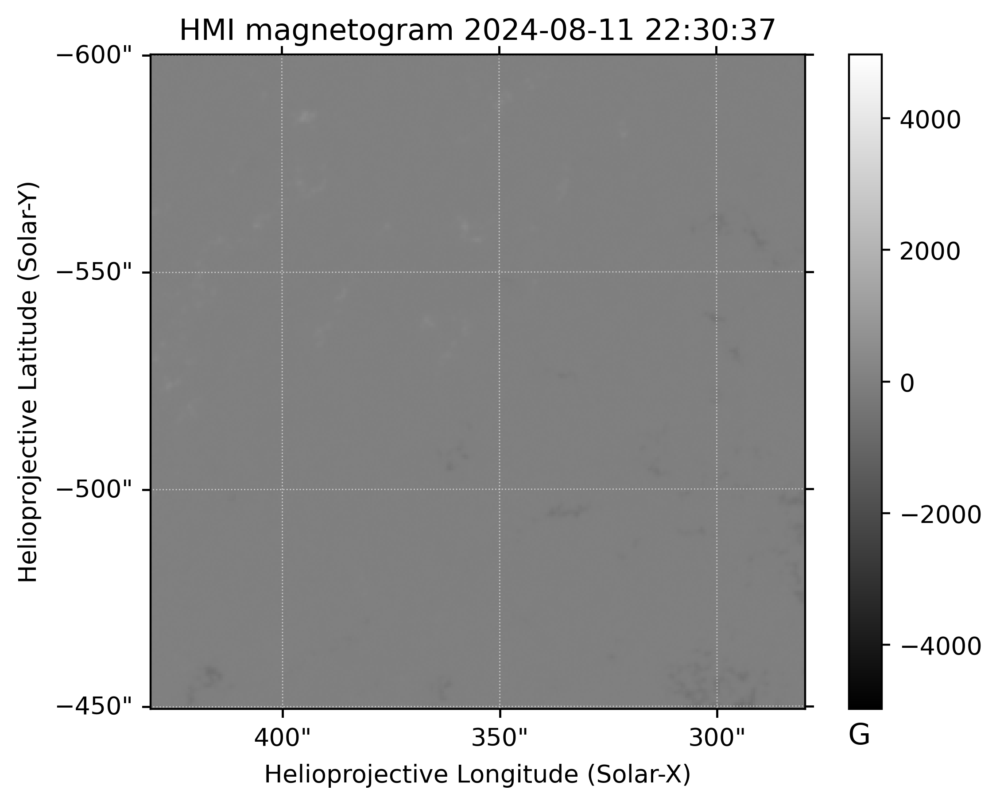

ValueError: Cannot manually specify vmin, as the norm already has vmin set. To prevent this error set vmin on `m.plot_settings["norm"]` or the norm passed to `m.plot`.

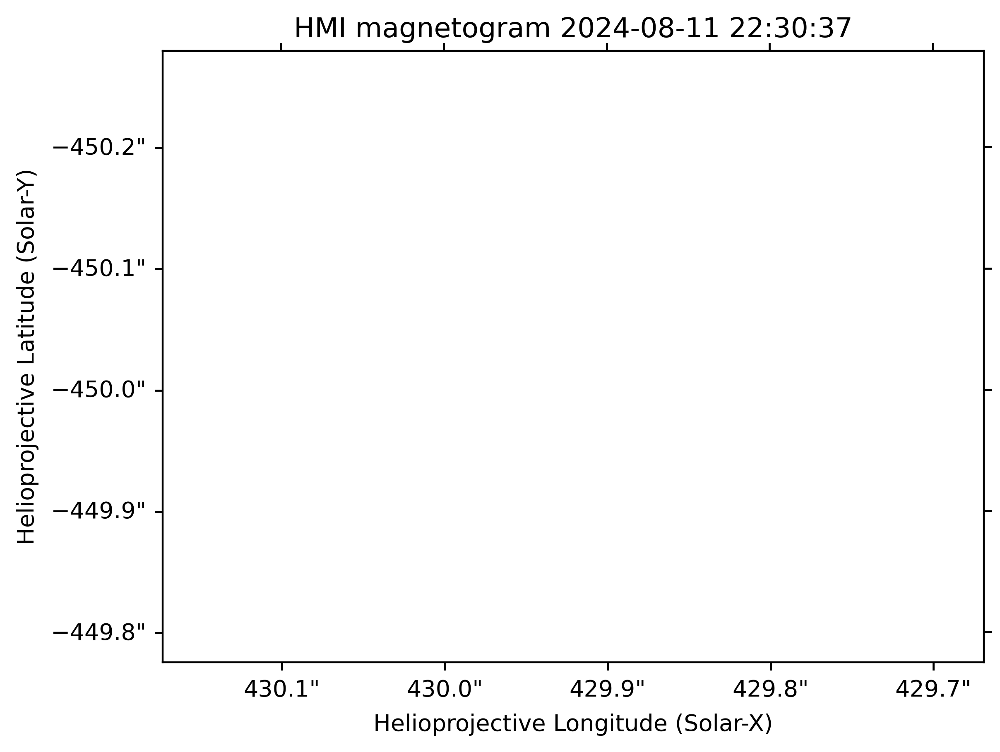

In [5]:
blc = SkyCoord(280, -600, unit="arcsec", frame=m_hmi.coordinate_frame)
fov = {"width": 150 * u.arcsec, "height": 150 * u.arcsec}
m_hmic = m_hmi.submap(blc, **fov)
m_hmic.peek()
m_hmic.peek(vmin=0)

In [4]:
t_start = parse_time("2024-08-11T22:30:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 60 * u.s),
    a.Instrument.hmi)
files = Fido.fetch(search_results[0][1], max_conn=1)
m_hmi = sunpy.map.Map(files[0])


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

hmi.m_45s.2024.08.11_22_31_30_TAI.magnetogram.fits:   0%|          | 0.00/16.3M [00:00<?, ?B/s]

In [4]:
files = Fido.fetch(search_results[0][32], max_conn=1)


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

2025-09-23 15:48:02 - parfive - INFO: https://sdo7.nascom.nasa.gov/cgi-bin/drms_export.cgi?series=aia__lev1;compress=rice;record=1600_1440016421-1440016421 failed to download with exception
Timeout on reading data from socket


1/0 files failed to download. Please check `.errors` for details


In [28]:
files = Fido.fetch(search_results[0][32], max_conn=1)
m_aia = sunpy.map.Map(files)
blc = SkyCoord(650, -500, unit="arcsec", frame=m_aia.coordinate_frame)
fov = {"width": 100 * u.arcsec, "height": 50 * u.arcsec}
m_aia_cutout = m_aia.submap(blc, **fov)
m_aia_cutout.peek()

RuntimeError: No maps loaded

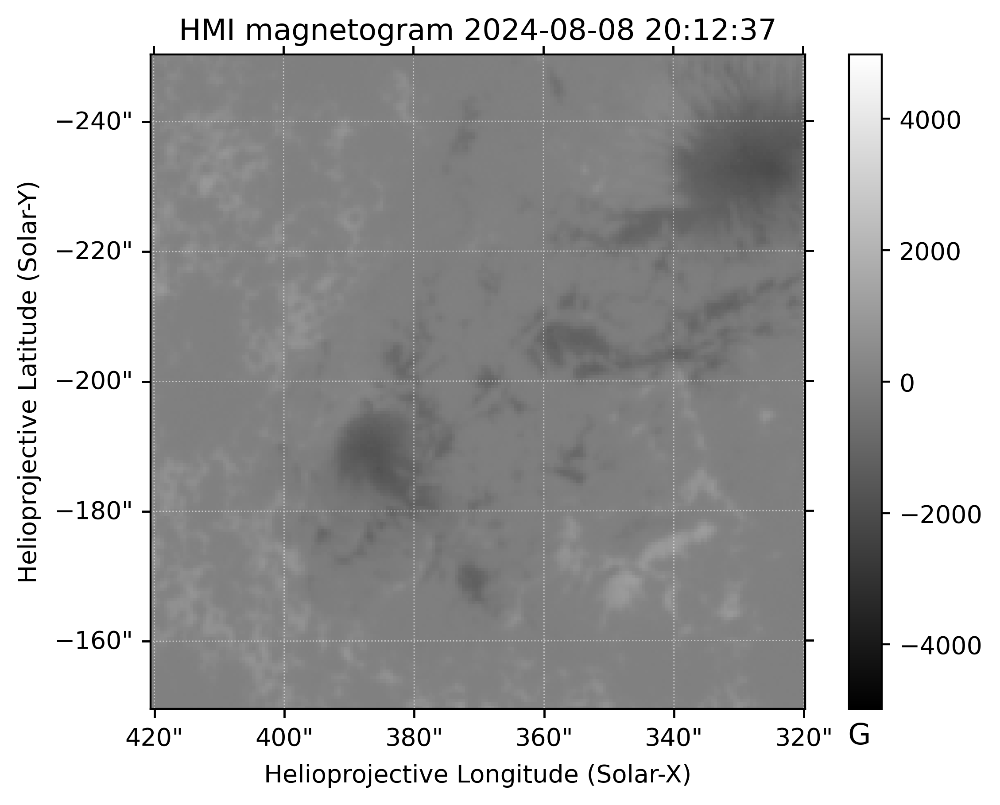

In [28]:
blc = SkyCoord(320, -250, unit="arcsec", frame=m_hmi.coordinate_frame)
fov = {"width": 100 * u.arcsec, "height": 100 * u.arcsec}
m_hmi_cutout = m_hmi.submap(blc, **fov)
m_hmi_cutout.peek()

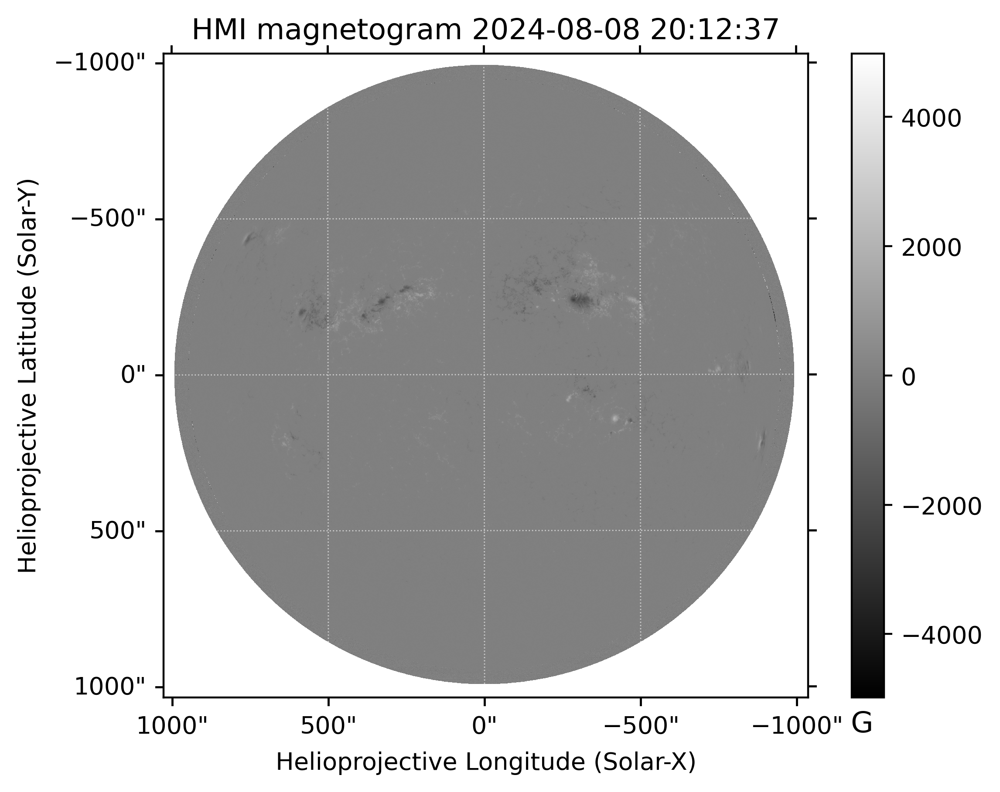

In [38]:
m_hmi.peek()

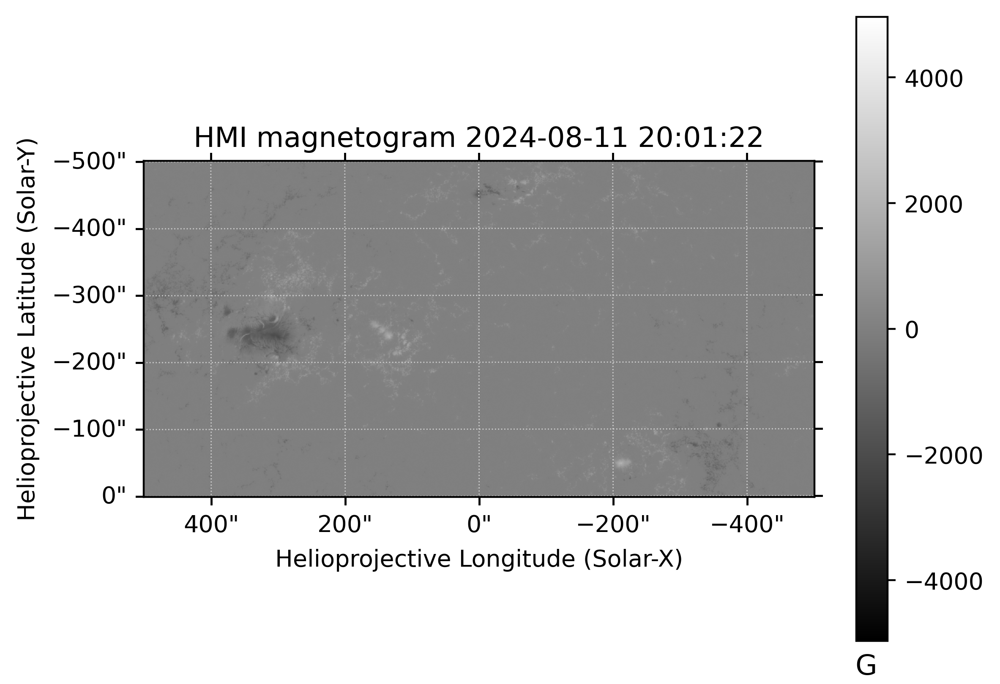

In [39]:
m_hmi = sunpy.map.Map(files[3])
blc = SkyCoord(-500, -500, unit="arcsec", frame=m_hmi.coordinate_frame)
fov = {"width": 1000 * u.arcsec, "height": 500 * u.arcsec}
m_hmi_cutout = m_hmi.submap(blc, **fov)
m_hmi_cutout.peek()

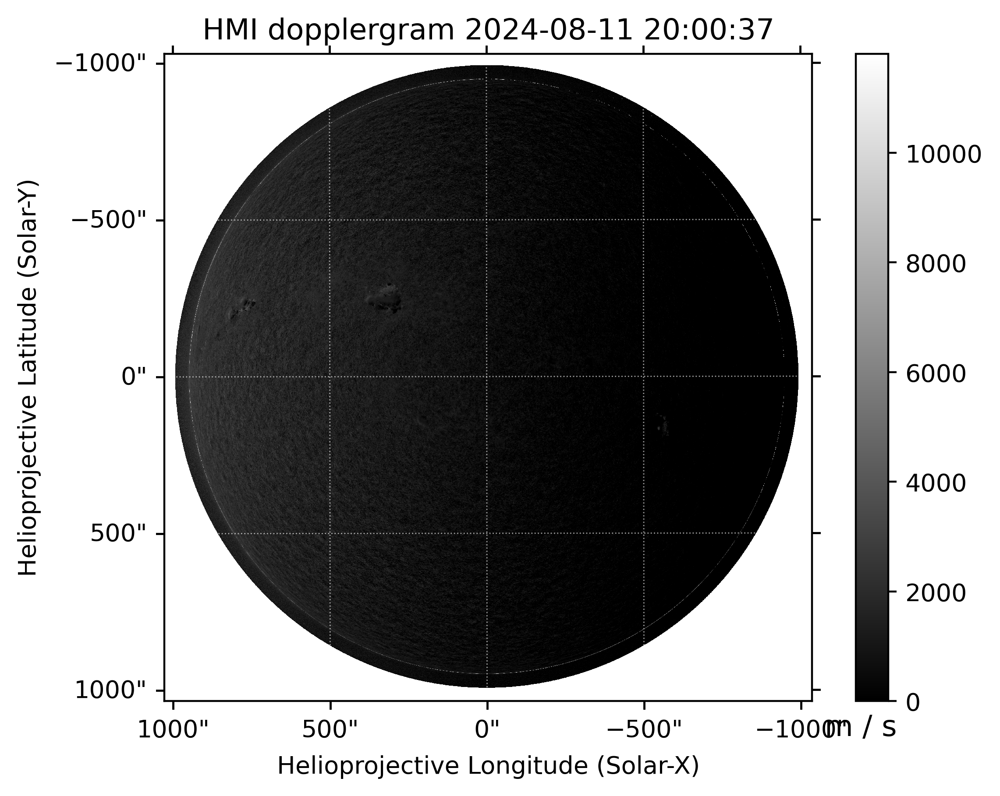

In [13]:
m_hmi.peek(vmin=0)

In [22]:
t_start = parse_time("2024-08-08T19:30:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 24 * u.s),
    a.Instrument.aia,
    a.Wavelength(171 * u.angstrom) | a.Wavelength(1600 * u.angstrom)| a.Wavelength(304 * u.angstrom),
)
search_results

Start Time,End Time,Source,Instrument,Wavelength,Provider,Physobs,Wavetype,Extent Width,Extent Length,Extent Type,Size
,,,,Angstrom,,,,,,,Mibyte
Time,Time,str3,str3,float64[2],str4,str9,str6,str4,str4,str8,float64
2024-08-08 19:30:09.000,2024-08-08 19:30:10.000,SDO,AIA,171.0 .. 171.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,64.64844
2024-08-08 19:30:21.000,2024-08-08 19:30:22.000,SDO,AIA,171.0 .. 171.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,64.64844
Start Time,End Time,Source,Instrument,Wavelength,Provider,Physobs,Wavetype,Extent Width,Extent Length,Extent Type,Size
,,,,Angstrom,,,,,,,Mibyte
Time,Time,str3,str3,float64[2],str4,str9,str6,str4,str4,str8,float64
2024-08-08 19:30:14.000,2024-08-08 19:30:15.000,SDO,AIA,1600.0 .. 1600.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,64.64844
Start Time,End Time,Source,Instrument,Wavelength,Provider,Physobs,Wavetype,Extent Width,Extent Length,Extent Type,Size
,,,,Angstrom,,,,,,,Mibyte


In [23]:
files = Fido.fetch(search_results, max_conn=1)

Files Downloaded:   0%|          | 0/5 [00:00<?, ?file/s]

aia.lev1.171A_2024_08_08T19_30_21.35Z.image_lev1.fits:   0%|          | 0.00/12.3M [00:00<?, ?B/s]

5/0 files failed to download. Please check `.errors` for details


In [28]:
files

[]
Errors:
(<parfive.results.Error object at 0x31b9a2bd0>
https://sdo7.nascom.nasa.gov/cgi-bin/drms_export.cgi?series=aia__lev1;compress=rice;record=171_1502220647-1502220647,
Download Failed: https://sdo7.nascom.nasa.gov/cgi-bin/drms_export.cgi?series=aia__lev1;compress=rice;record=171_1502220647-1502220647 with error <ClientResponse(https://sdo7.nascom.nasa.gov/cgi-bin/drms_export.cgi?series=aia__lev1;compress=rice;record=171_1502220647-1502220647) [500 Internal Server Error]>
<CIMultiDictProxy('Date': 'Thu, 27 Mar 2025 14:28:19 GMT', 'Server': 'Apache', 'Strict-Transport-Security': 'max-age=31536000; includeSubDomains', 'Content-Length': '541', 'Connection': 'close', 'Content-Type': 'text/html; charset=iso-8859-1')>
)(<parfive.results.Error object at 0x31b9a1c10>
https://sdo7.nascom.nasa.gov/cgi-bin/drms_export.cgi?series=aia__lev1;compress=rice;record=171_1502220659-1502220659,
Timeout on reading data from socket)(<parfive.results.Error object at 0x31b9a0530>
https://sdo7.nascom.na

In [30]:
m_171 = sunpy.map.Map(files[0])

IndexError: list index out of range

In [ ]:
m_171.peek(vmin=0)

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

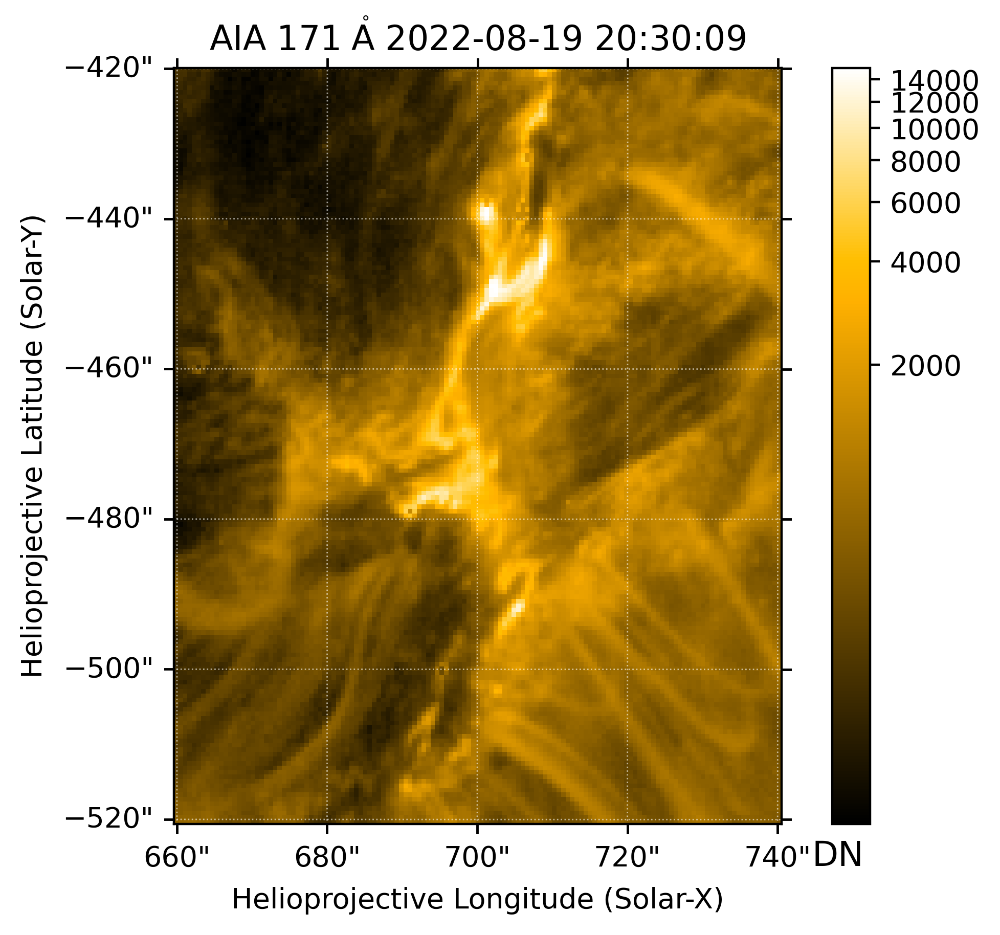

In [47]:
t_start = parse_time("2022-08-19T20:30:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 12 * u.s),
    a.Instrument.aia,
    a.Wavelength(171 * u.angstrom) | a.Wavelength(1600 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_171 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_171.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_171_cutout = m_171.submap(blc, **fov)
m_171_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.131A_2022_08_19T20_30_10.12Z.image_lev1.fits:   0%|          | 0.00/7.15M [00:00<?, ?B/s]

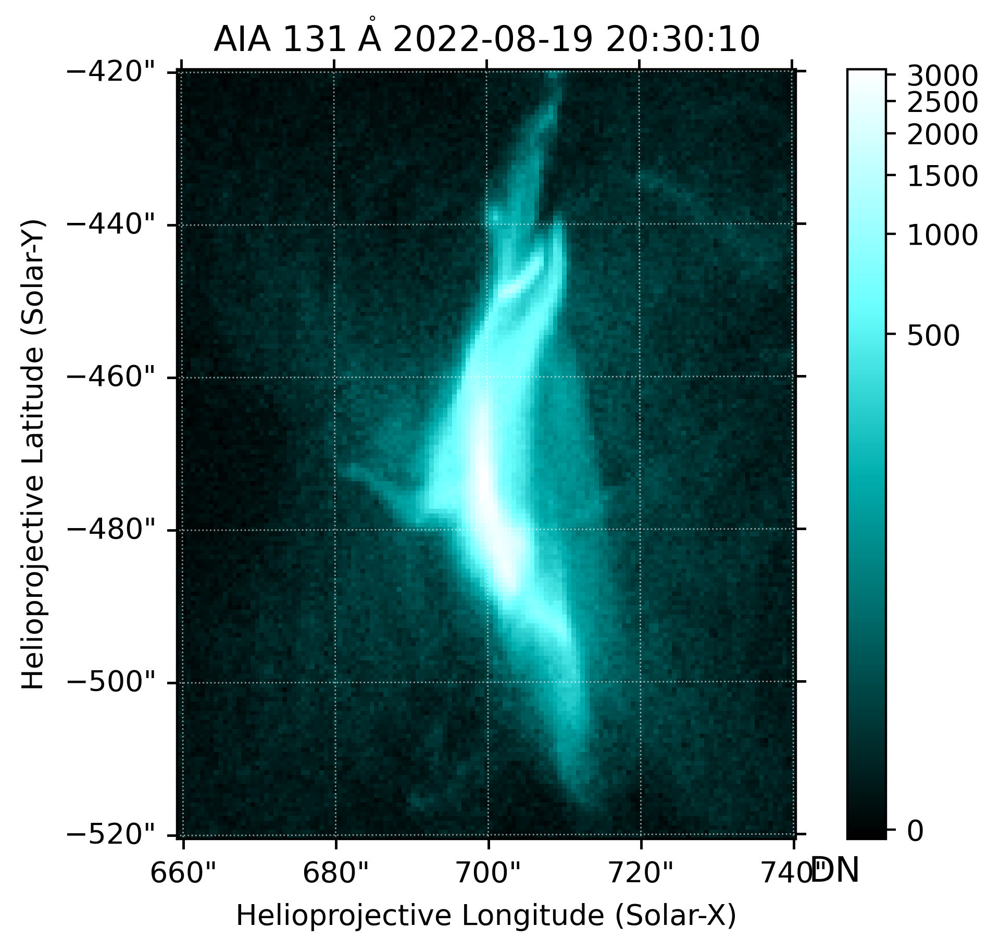

In [65]:
t_start = parse_time("2022-08-19T20:30:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 12 * u.s),
    a.Instrument.aia,
    a.Wavelength(131 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_131 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_131.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_131_cutout = m_131.submap(blc, **fov)
m_131_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.1600A_2022_08_19T20_30_14.13Z.image_lev1.fits:   0%|          | 0.00/8.63M [00:00<?, ?B/s]

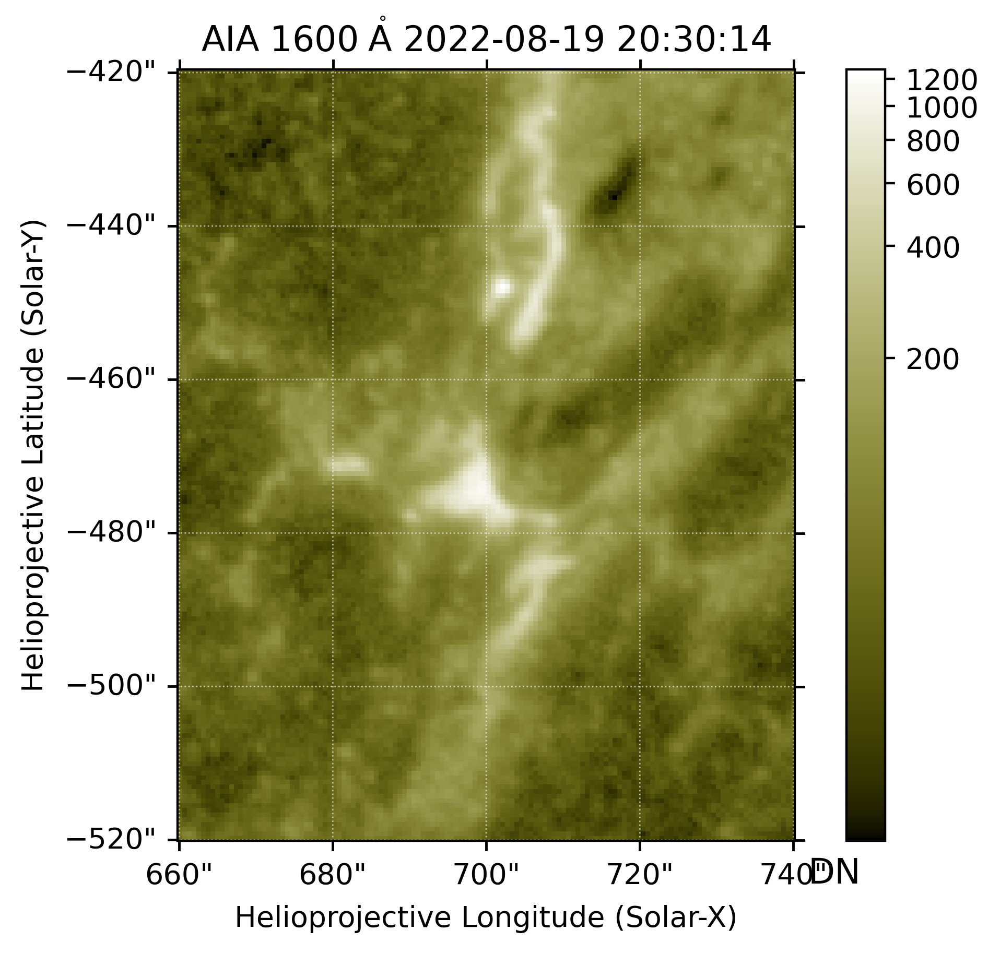

In [75]:
t_start = parse_time("2022-08-19T20:30:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 30 * u.s),
    a.Instrument.aia,
    a.Wavelength(1600 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_1600 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_1600.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_1600_cutout = m_1600.submap(blc, **fov)
m_1600_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

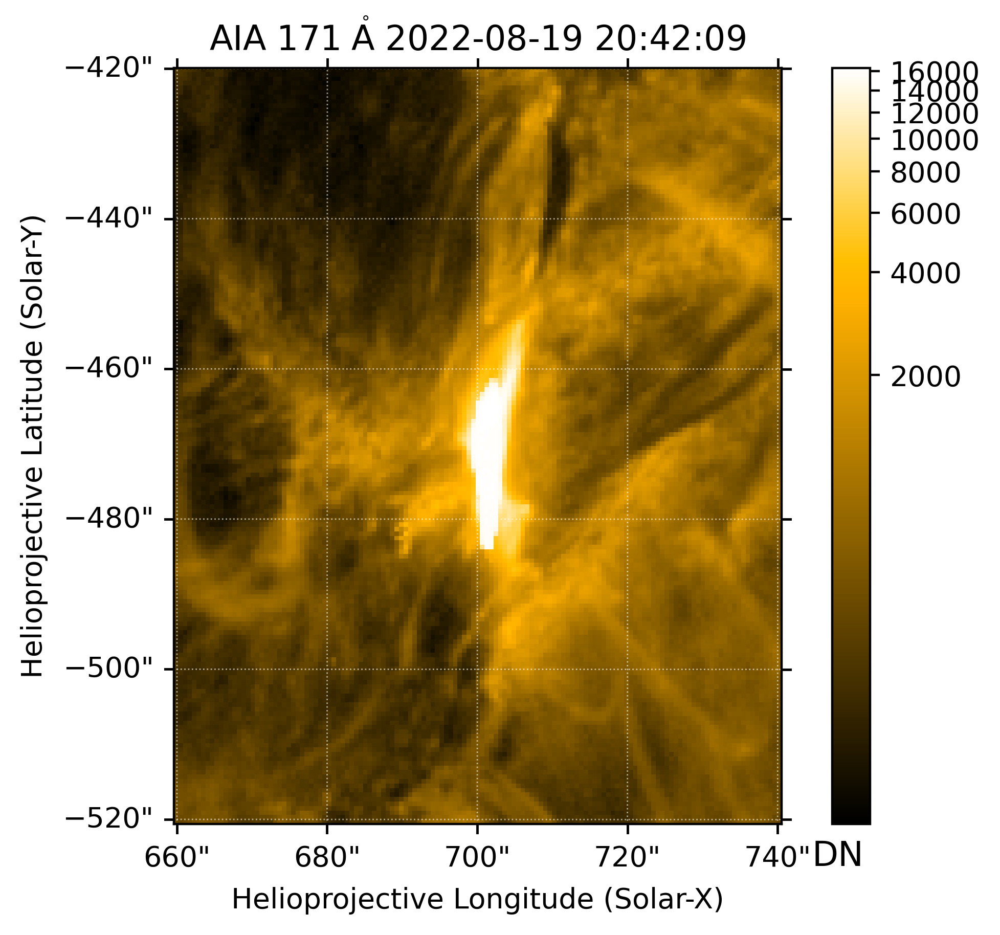

In [48]:
t_start = parse_time("2022-08-19T20:42:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 12 * u.s),
    a.Instrument.aia,
    a.Wavelength(171 * u.angstrom) | a.Wavelength(1600 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_171 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_171.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_171_cutout = m_171.submap(blc, **fov)
m_171_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.131A_2022_08_19T20_42_06.62Z.image_lev1.fits:   0%|          | 0.00/8.29M [00:00<?, ?B/s]

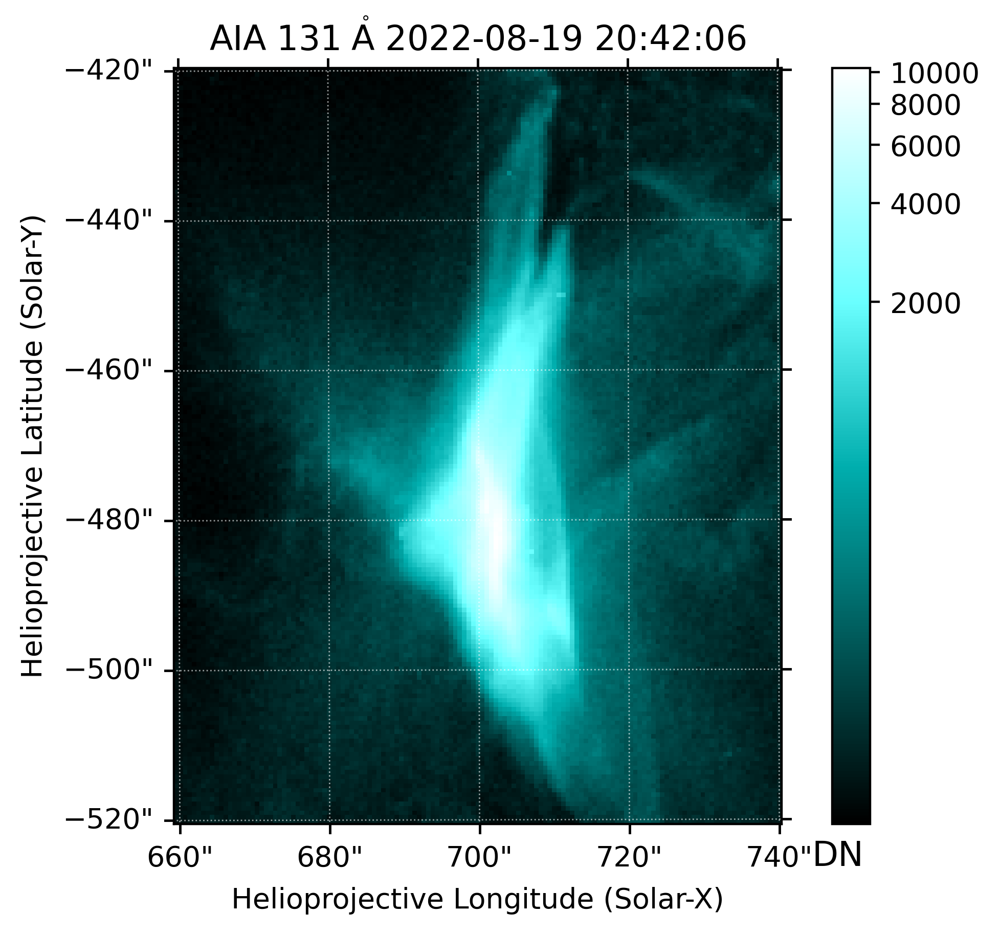

In [53]:
t_start = parse_time("2022-08-19T20:42:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 12 * u.s),
    a.Instrument.aia,
    a.Wavelength(131 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_131 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_131.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_131_cutout = m_171.submap(blc, **fov)
m_131_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.1600A_2022_08_19T20_42_14.13Z.image_lev1.fits:   0%|          | 0.00/8.63M [00:00<?, ?B/s]

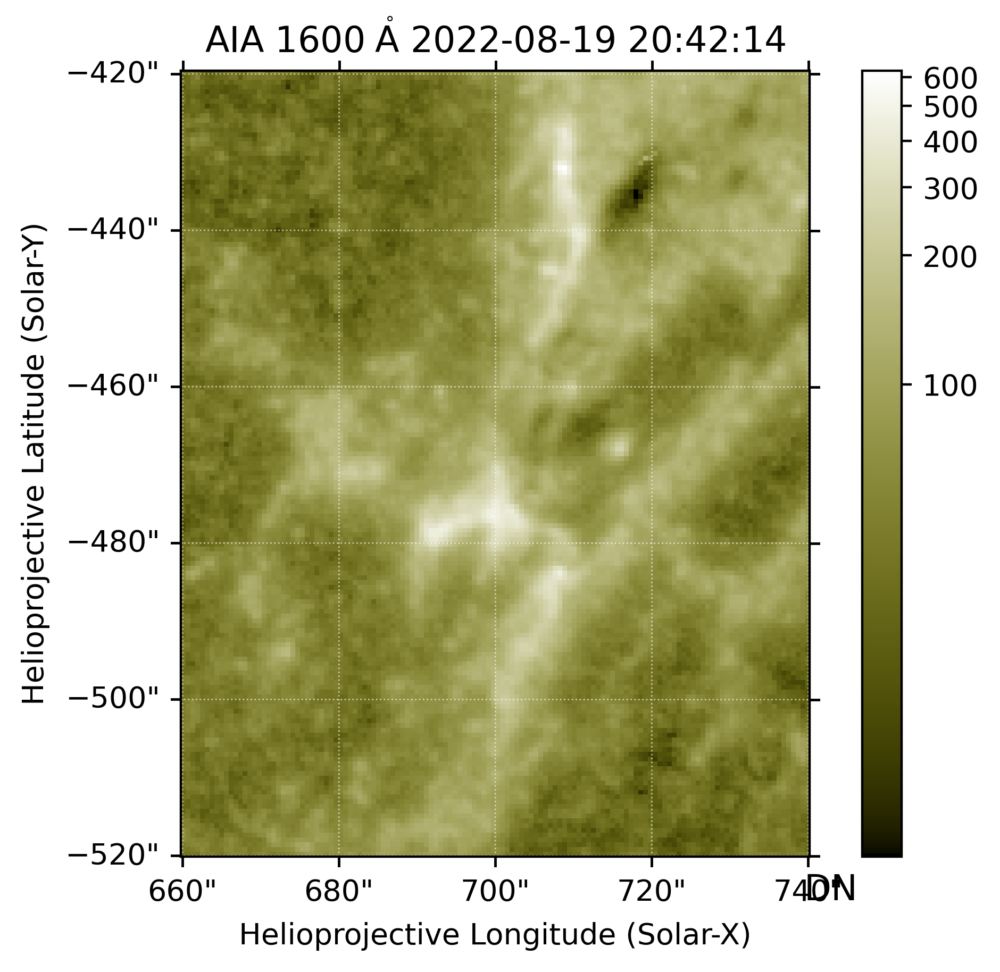

In [77]:
t_start = parse_time("2022-08-19T20:42:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 30 * u.s),
    a.Instrument.aia,
    a.Wavelength(1600 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_1600 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_1600.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_1600_cutout = m_1600.submap(blc, **fov)
m_1600_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.171A_2022_08_19T20_55_09.35Z.image_lev1.fits:   0%|          | 0.00/11.7M [00:00<?, ?B/s]

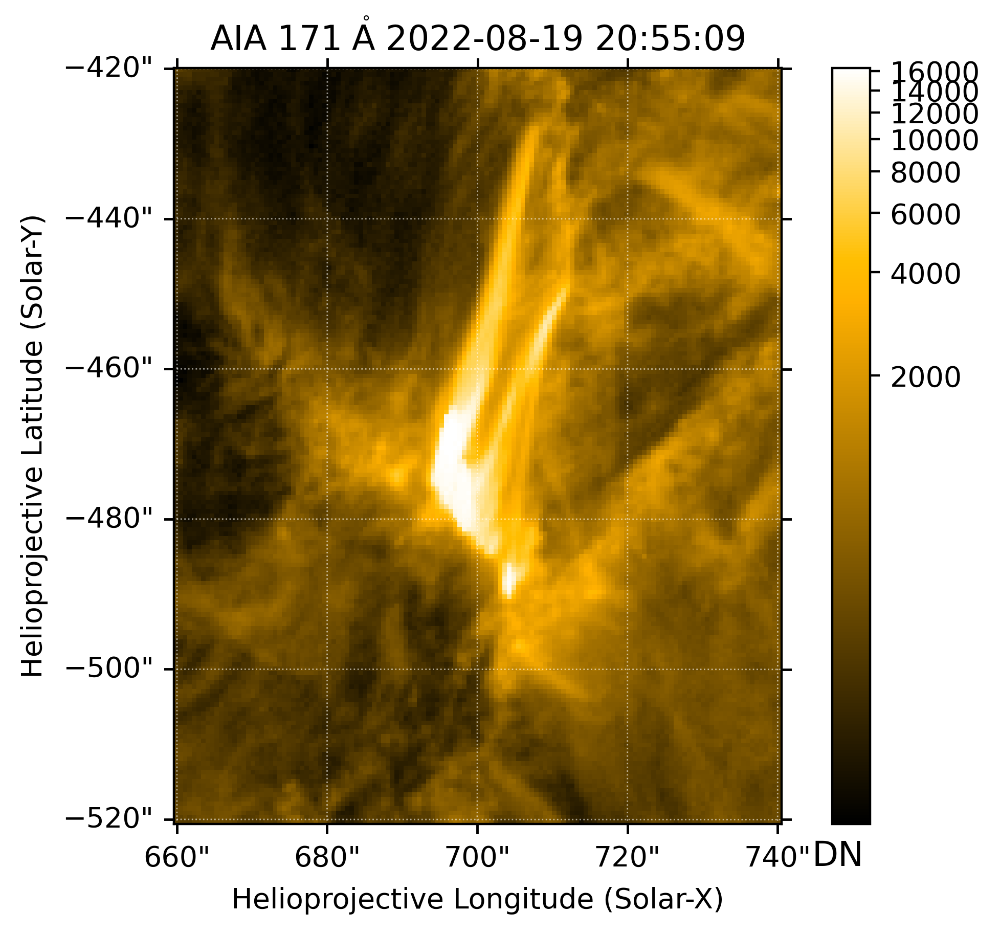

In [57]:
t_start = parse_time("2022-08-19T20:55:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 12 * u.s),
    a.Instrument.aia,
    a.Wavelength(171 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_171 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_171.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_171_cutout = m_171.submap(blc, **fov)
m_171_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

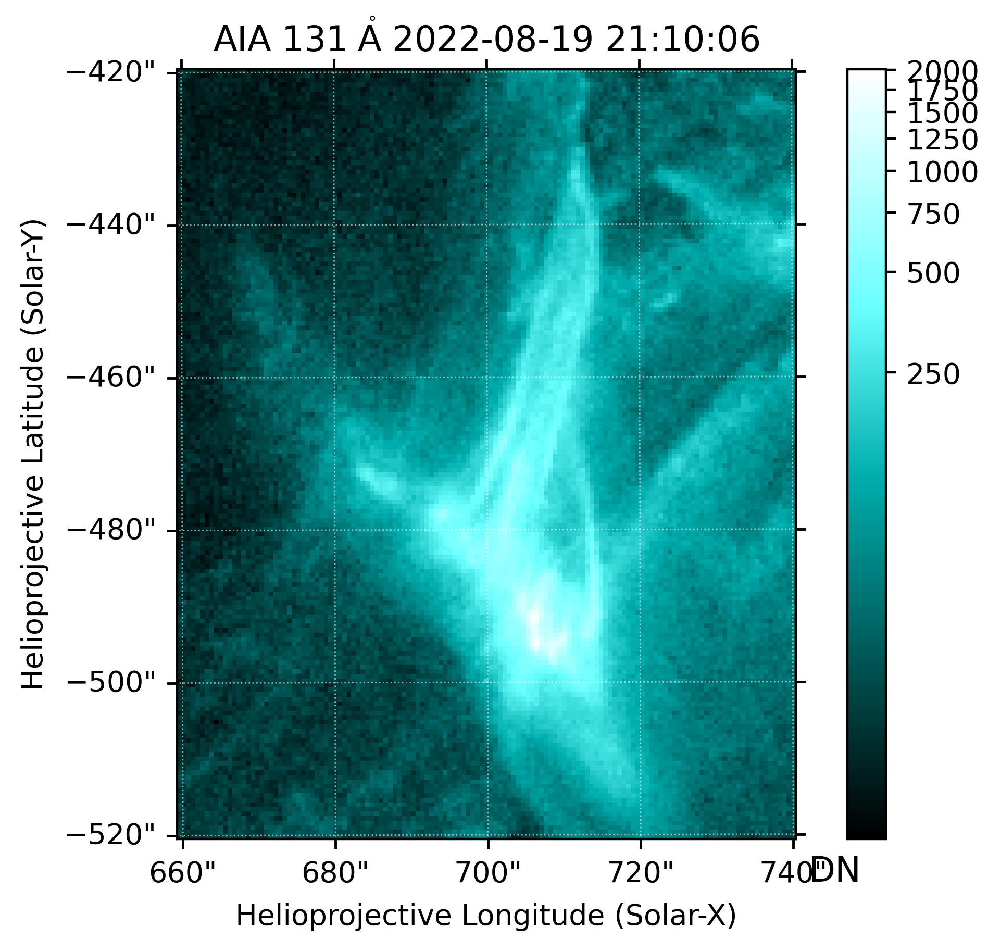

In [61]:
t_start = parse_time("2022-08-19T21:10:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 12 * u.s),
    a.Instrument.aia,
    a.Wavelength(131 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_131 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_131.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_131_cutout = m_131.submap(blc, **fov)
m_131_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.1600A_2022_08_19T21_10_14.13Z.image_lev1.fits:   0%|          | 0.00/8.63M [00:00<?, ?B/s]

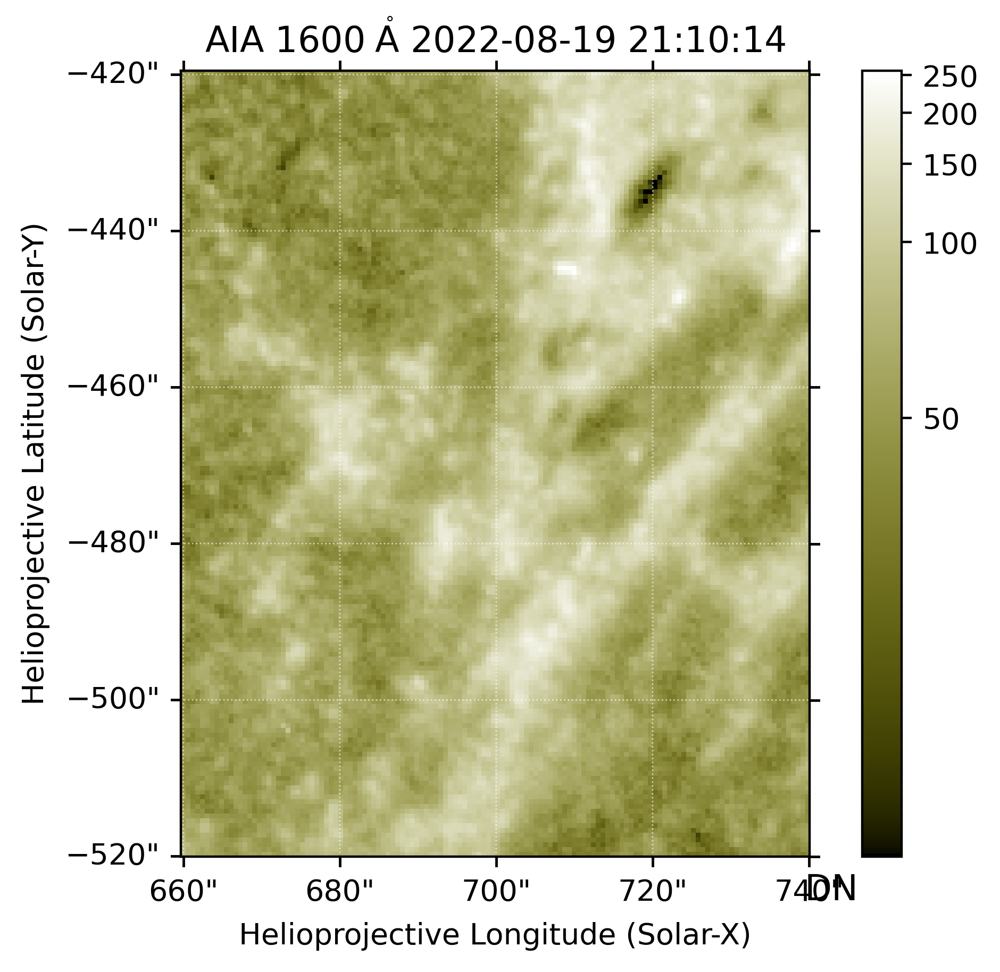

In [79]:
t_start = parse_time("2022-08-19T21:10:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 30 * u.s),
    a.Instrument.aia,
    a.Wavelength(1600 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_1600 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_1600.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_1600_cutout = m_1600.submap(blc, **fov)
m_1600_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.171A_2022_08_19T21_10_09.35Z.image_lev1.fits:   0%|          | 0.00/11.7M [00:00<?, ?B/s]

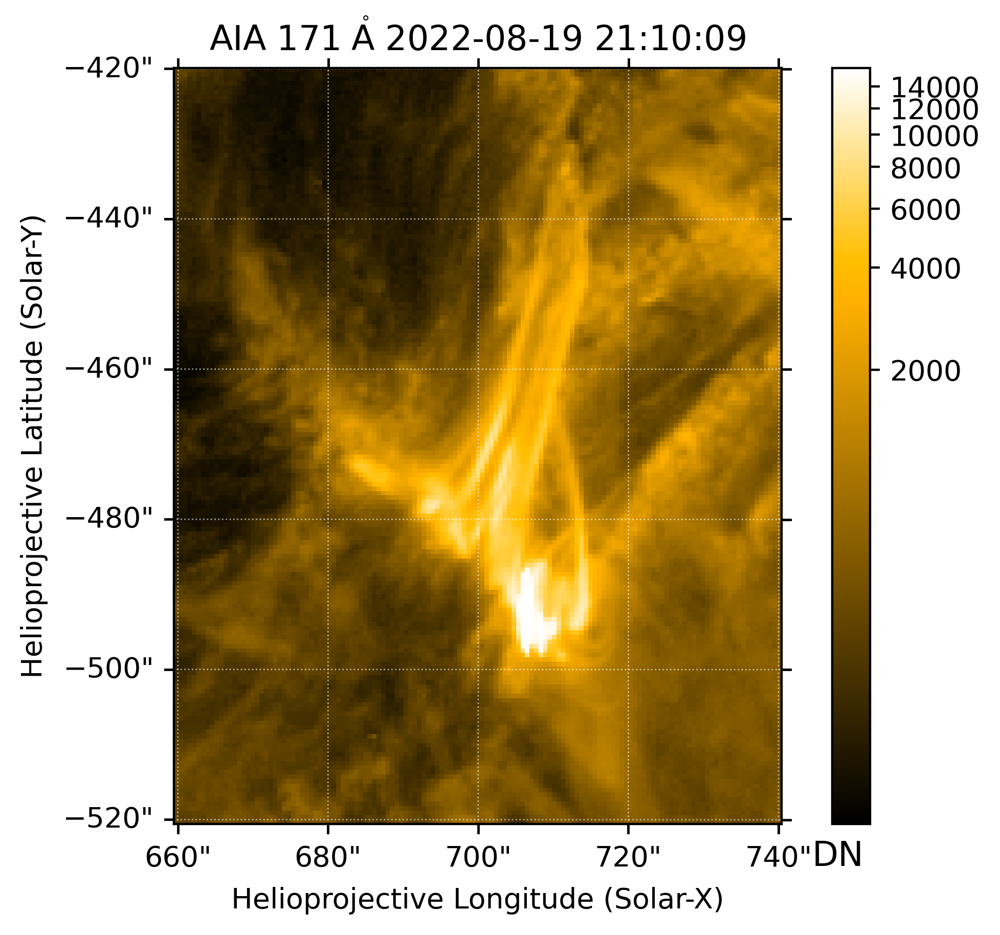

In [62]:
t_start = parse_time("2022-08-19T21:10:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 12 * u.s),
    a.Instrument.aia,
    a.Wavelength(171 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_171 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_171.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_171_cutout = m_171.submap(blc, **fov)
m_171_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.131A_2022_08_19T21_30_06.63Z.image_lev1.fits:   0%|          | 0.00/8.27M [00:00<?, ?B/s]

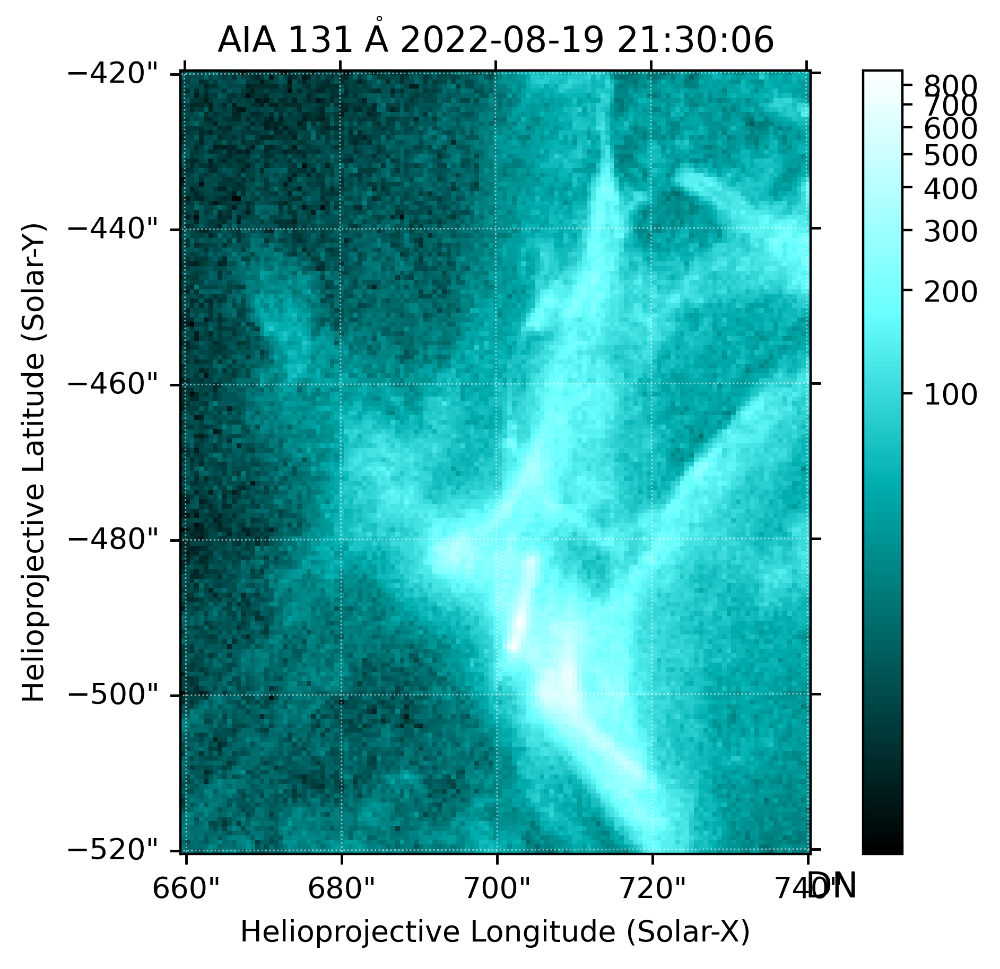

In [69]:
t_start = parse_time("2022-08-19T21:30:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 12 * u.s),
    a.Instrument.aia,
    a.Wavelength(131 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_131 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_131.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_131_cutout = m_131.submap(blc, **fov)
m_131_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.1600A_2022_08_19T21_30_14.13Z.image_lev1.fits:   0%|          | 0.00/8.63M [00:00<?, ?B/s]

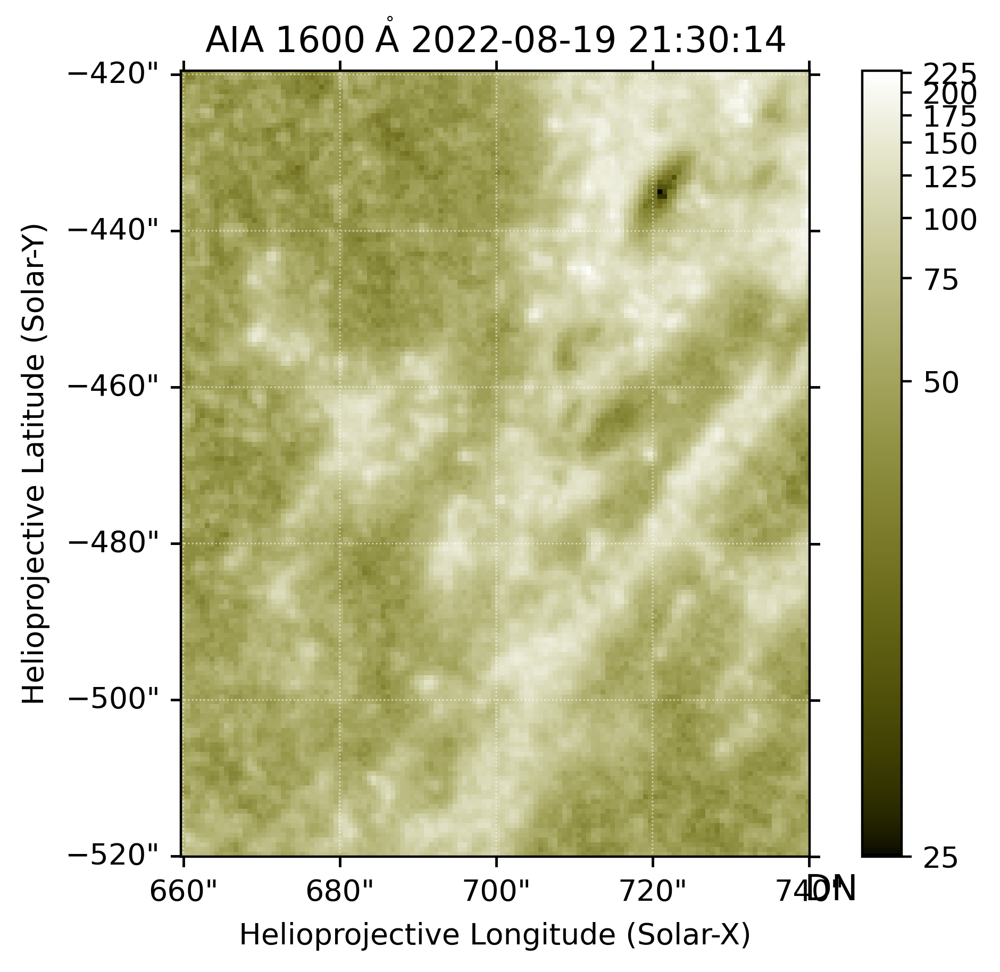

In [80]:
t_start = parse_time("2022-08-19T21:30:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 30 * u.s),
    a.Instrument.aia,
    a.Wavelength(1600 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_1600 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_1600.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_1600_cutout = m_1600.submap(blc, **fov)
m_1600_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.171A_2022_08_19T21_30_09.35Z.image_lev1.fits:   0%|          | 0.00/11.7M [00:00<?, ?B/s]

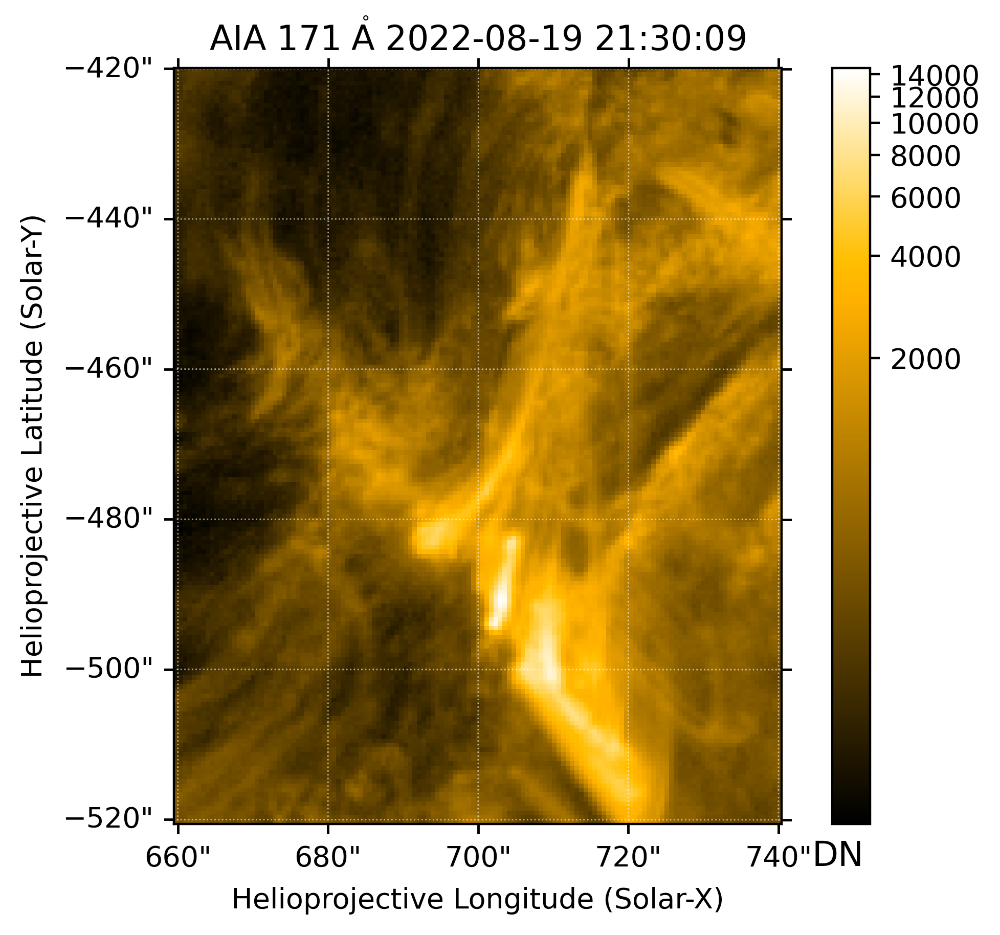

In [70]:
t_start = parse_time("2022-08-19T21:30:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 12 * u.s),
    a.Instrument.aia,
    a.Wavelength(171 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_171 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_171.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_171_cutout = m_171.submap(blc, **fov)
m_171_cutout.peek()